In [1]:
import os
import gc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split

pd.options.plotting.backend = "plotly"

In [2]:
cardinalities = [
    "N", "NNE", "NE", "ENE", 
    "E", "ESE", "SE", "SSE", 
    "S", "SSW", "SW", "WSW", 
    "W", "WNW", "NW", "NNW"
]
cardinals_vals = np.cos(np.linspace(0, 2*np.pi, len(cardinalities)+1))
cardinalities_map = {direction: value for direction, value in zip(cardinalities, cardinals_vals)}


def process_data(df, cardinalities_map):
    if "RISK_MM" in df:
        df.drop(columns=["RISK_MM"], inplace=True)
    df.dropna(subset=["RainTomorrow"], inplace=True)
    df["Date"] = pd.to_datetime(df["Date"])
    df["Location"] = df["Location"].astype("string")
    df["WindGustDir"] = df["WindGustDir"].map(cardinalities_map)
    df["WindDir9am"] = df["WindDir9am"].map(cardinalities_map)
    df["WindDir3pm"] = df["WindDir3pm"].map(cardinalities_map)
    df["RainToday"] = df["RainToday"].map({"No": 0, "Yes": 1})
    df["RainTomorrow"] = df["RainTomorrow"].map({"No": 0, "Yes": 1})
    rain_adj_factor = (df
                       .groupby("Location")
                       .apply(lambda d: d.dropna(subset=['Rainfall'])['Date'].diff().dt.days)
                       .droplevel(0)
                       .fillna(1)
                       .rename("RainADJFactor"))
    df = df.merge(rain_adj_factor, left_index=True, right_index=True, how='left')
    df["RainADJFactor"] = df["RainADJFactor"].fillna(1)
    df["Rainfall"] = df["Rainfall"]/df["RainADJFactor"]
    df.drop(columns=["RainADJFactor"], inplace=True)
    return df

In [3]:
df1 = pd.read_csv("weatherAUS.csv.zip")
df1 = process_data(df1, cardinalities_map)
df2 = pd.read_csv("weatherAUS_second_source.csv.zip")  # from https://rdrr.io/cran/rattle.data/man/weatherAUS.html
df2 = process_data(df2, cardinalities_map)
df = pd.concat([df1, df2])
del df1; del df2; gc.collect()
df.drop_duplicates(subset=["Date", "Location"], keep="first", inplace=True)
df.sort_values(by=["Date", "Location"], inplace=True, ignore_index=True)
df.info()
df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205570 entries, 0 to 205569
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           205570 non-null  datetime64[ns]
 1   Location       205570 non-null  string        
 2   MinTemp        204483 non-null  float64       
 3   MaxTemp        204928 non-null  float64       
 4   Rainfall       203555 non-null  float64       
 5   Evaporation    101671 non-null  float64       
 6   Sunshine       91147 non-null   float64       
 7   WindGustDir    191573 non-null  float64       
 8   WindGustSpeed  191670 non-null  float64       
 9   WindDir9am     190565 non-null  float64       
 10  WindDir3pm     197577 non-null  float64       
 11  WindSpeed9am   202642 non-null  float64       
 12  WindSpeed3pm   198938 non-null  float64       
 13  Humidity9am    203259 non-null  float64       
 14  Humidity3pm    198628 non-null  float64       
 15  

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2007-11-01,Canberra,8.0,24.3,0.0,3.4,6.3,0.707107,30.0,-7.071068e-01,...,68.0,29.0,1019.7,1015.0,7.0,7.0,14.4,23.6,0.0,1
1,2007-11-02,Canberra,14.0,26.9,3.6,4.4,9.7,0.382683,39.0,6.123234e-17,...,80.0,36.0,1012.4,1008.4,5.0,3.0,17.5,25.7,1.0,1
2,2007-11-03,Canberra,13.7,23.4,3.6,5.8,3.3,0.707107,85.0,1.000000e+00,...,82.0,69.0,1009.5,1007.2,8.0,7.0,15.4,20.2,1.0,1
3,2007-11-04,Canberra,13.3,15.5,39.8,7.2,9.1,0.707107,54.0,3.826834e-01,...,62.0,56.0,1005.5,1007.0,2.0,7.0,13.5,14.1,1.0,1
4,2007-11-05,Canberra,7.6,16.1,2.8,5.6,10.6,-0.923880,50.0,-9.238795e-01,...,68.0,49.0,1018.3,1018.5,7.0,7.0,11.1,15.4,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205565,2021-02-27,Walpole,15.0,22.0,2.4,NaN,NaN,-0.707107,39.0,6.123234e-17,...,80.0,69.0,1015.5,1013.3,NaN,NaN,18.5,19.9,1.0,0
205566,2021-02-27,Watsonia,8.8,19.9,0.2,6.0,1.0,-0.923880,22.0,-1.000000e+00,...,98.0,54.0,1013.2,1012.2,7.0,7.0,10.2,19.5,0.0,0
205567,2021-02-27,Williamtown,21.4,24.7,0.0,NaN,NaN,-0.382683,31.0,3.826834e-01,...,86.0,86.0,1013.7,1012.0,8.0,8.0,22.0,22.7,0.0,0
205568,2021-02-27,Witchcliffe,14.7,25.4,0.0,NaN,NaN,-1.000000,48.0,-3.826834e-01,...,60.0,52.0,1014.4,1011.9,NaN,NaN,19.9,23.8,0.0,0


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,204483.0,12.163906,6.455025,-8.7,7.500000,1.200000e+01,16.900000,33.9
MaxTemp,204928.0,23.352364,7.201863,-4.8,18.000000,2.280000e+01,28.400000,48.9
Rainfall,203555.0,2.201064,8.054989,0.0,0.000000,0.000000e+00,0.600000,371.0
Evaporation,101671.0,5.596661,4.314050,0.0,2.800000,4.800000e+00,7.400000,145.0
Sunshine,91147.0,7.666357,3.767291,0.0,4.900000,8.500000e+00,10.700000,14.5
WindGustDir,191573.0,-0.044634,0.699554,-1.0,-0.707107,-1.836970e-16,0.707107,1.0
WindGustSpeed,191670.0,40.154656,13.591801,2.0,31.000000,3.900000e+01,48.000000,135.0
WindDir9am,190565.0,0.012059,0.719054,-1.0,-0.707107,6.123234e-17,0.707107,1.0
WindDir3pm,197577.0,-0.039428,0.700051,-1.0,-0.707107,-1.836970e-16,0.707107,1.0
WindSpeed9am,202642.0,14.056864,8.888583,0.0,7.000000,1.300000e+01,19.000000,130.0


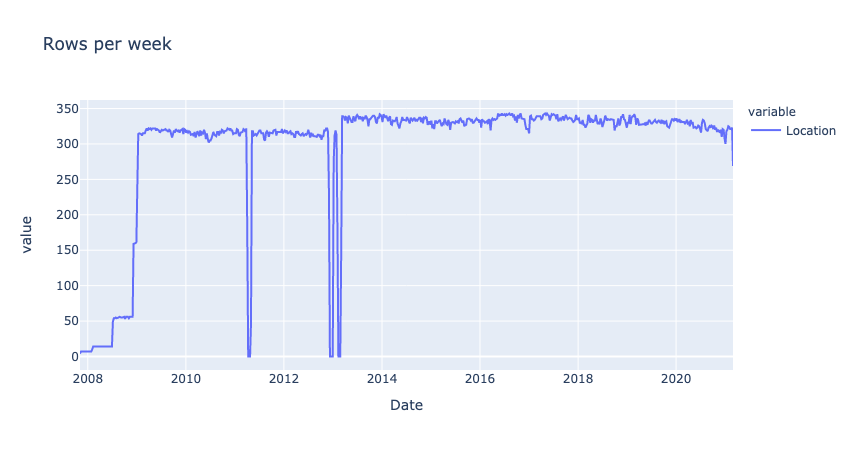

In [6]:
df.set_index("Date").resample("W")["Location"].count().plot(title="Rows per week")

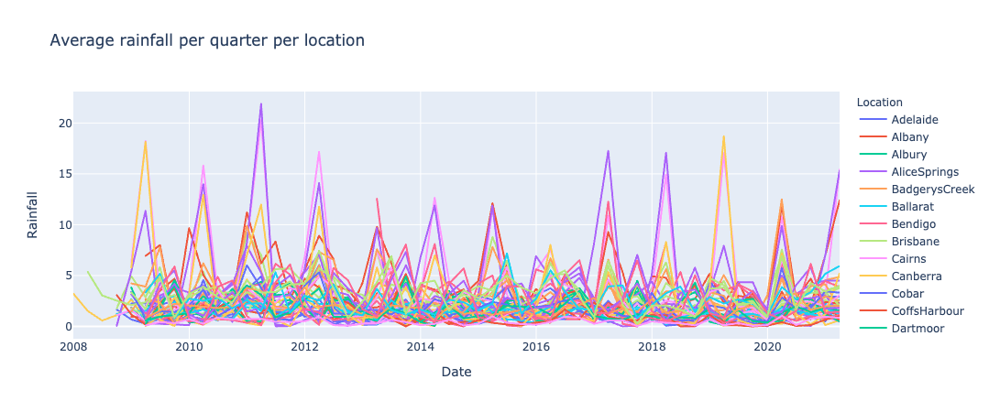

In [7]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["Rainfall"]
     .mean().reset_index()),
    x='Date',
    y='Rainfall',
    color='Location',
    title="Average rainfall per quarter per location"
)
fig.show()

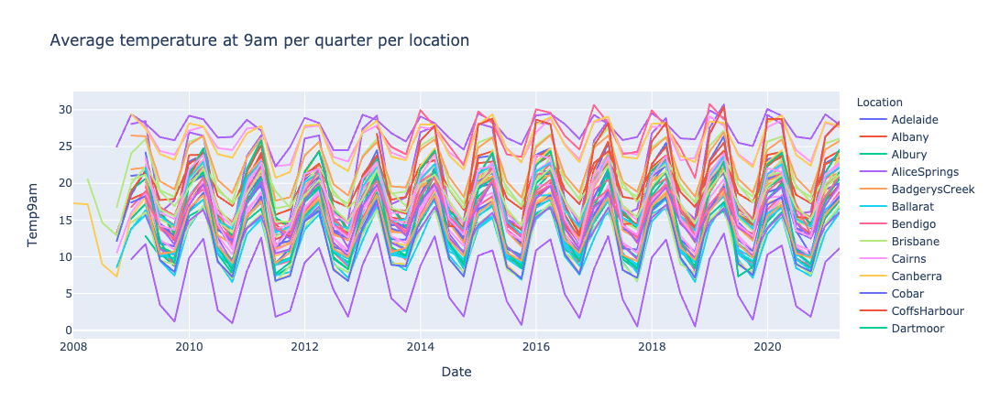

In [8]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["Temp9am"]
     .mean().reset_index()),
    x='Date',
    y='Temp9am',
    color='Location',
    title="Average temperature at 9am per quarter per location"
)
fig.show()

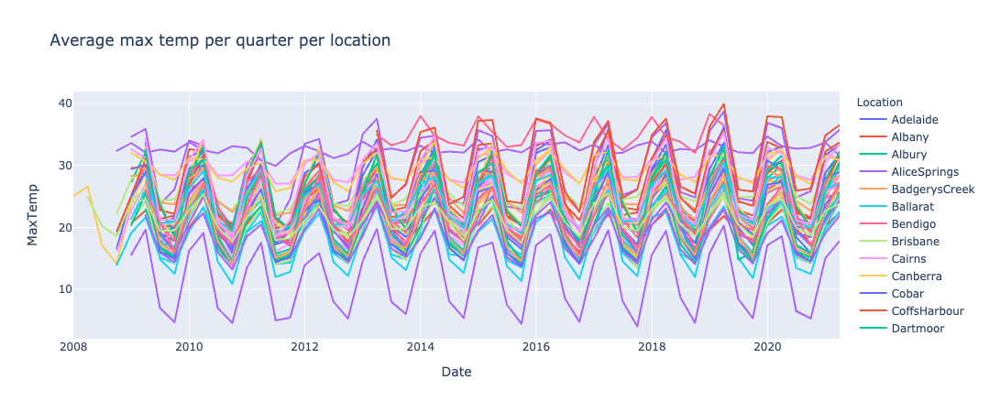

In [9]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["MaxTemp"]
     .mean().reset_index()),
    x='Date',
    y='MaxTemp',
    color='Location',
    title="Average max temp per quarter per location"
)
fig.show()

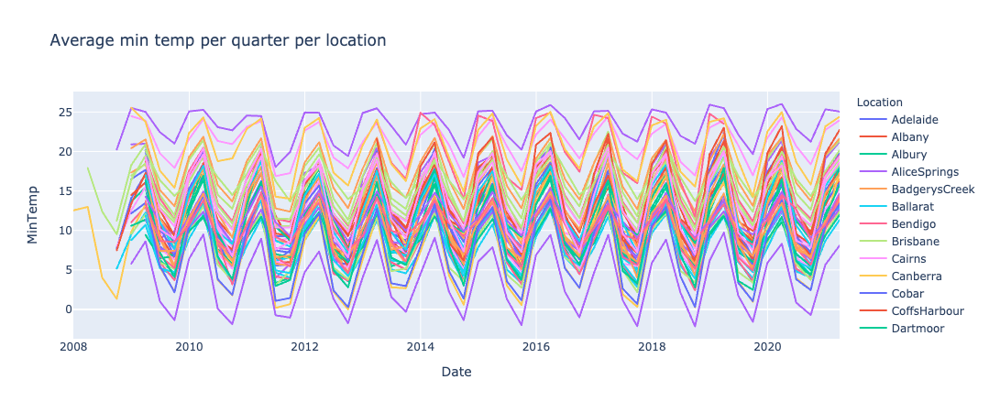

In [10]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["MinTemp"]
     .mean().reset_index()),
    x='Date',
    y='MinTemp',
    color='Location',
    title="Average min temp per quarter per location"
)
fig.show()

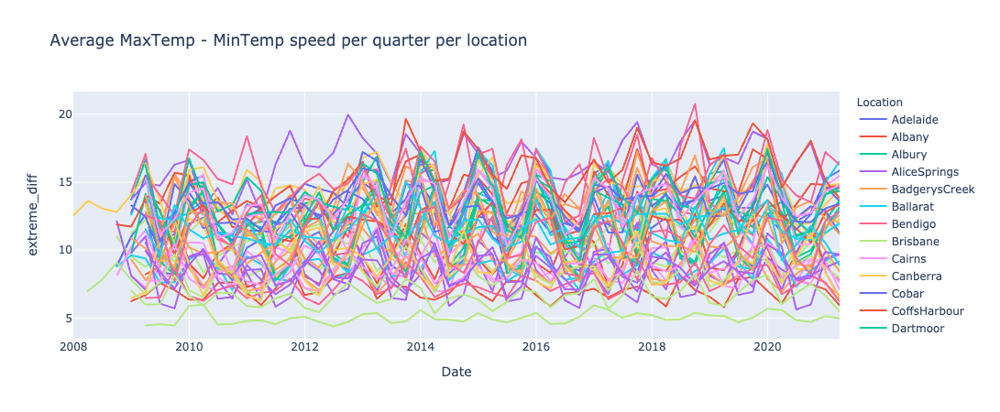

In [11]:
fig = px.line(
    (df
     .assign(extreme_diff=lambda r: r.MaxTemp - r.MinTemp)
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["extreme_diff"]
     .mean().reset_index()),
    x='Date',
    y='extreme_diff',
    color='Location',
    title="Average MaxTemp - MinTemp speed per quarter per location"
)
fig.show()

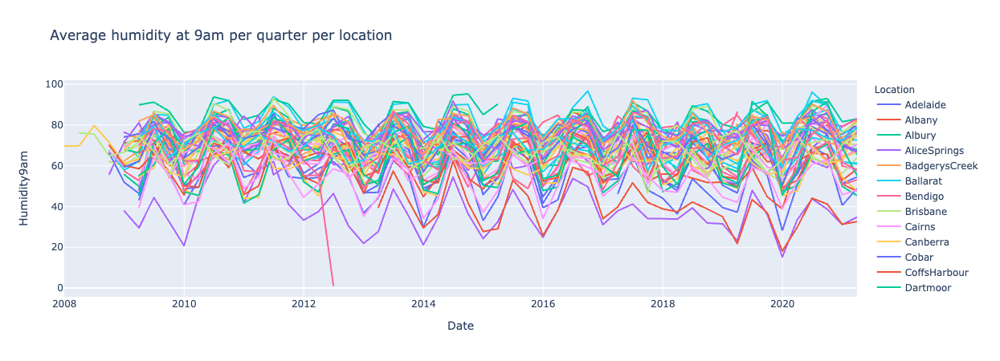

In [12]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["Humidity9am"]
     .mean().reset_index()),
    x='Date',
    y='Humidity9am',
    color='Location',
    title="Average humidity at 9am per quarter per location"
)
fig.show()

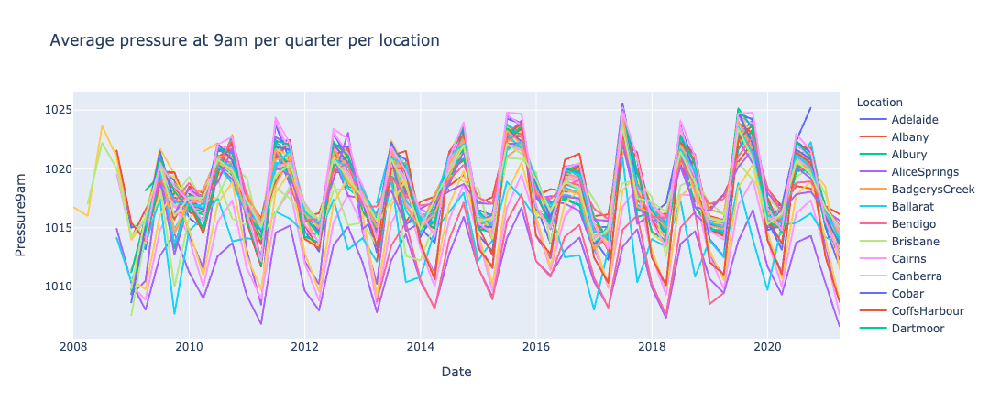

In [13]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["Pressure9am"]
     .mean().reset_index()),
    x='Date',
    y='Pressure9am',
    color='Location',
    title="Average pressure at 9am per quarter per location"
)
fig.show()

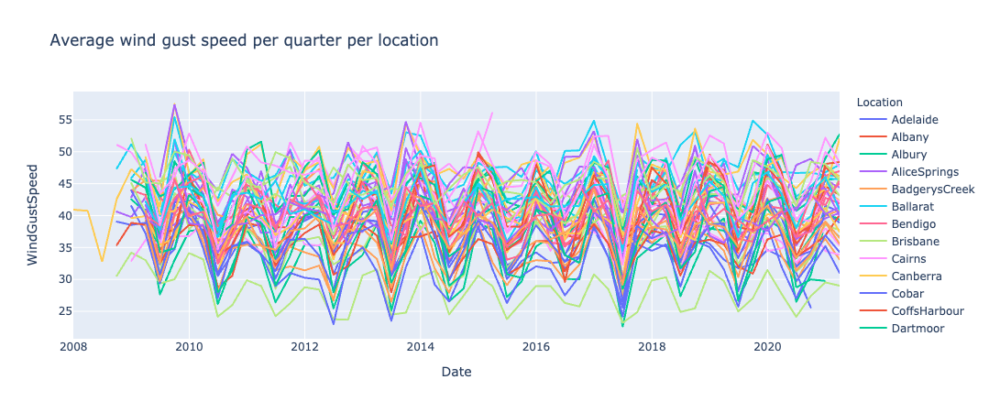

In [14]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["WindGustSpeed"]
     .mean().reset_index()),
    x='Date',
    y='WindGustSpeed',
    color='Location',
    title="Average wind gust speed per quarter per location"
)
fig.show()

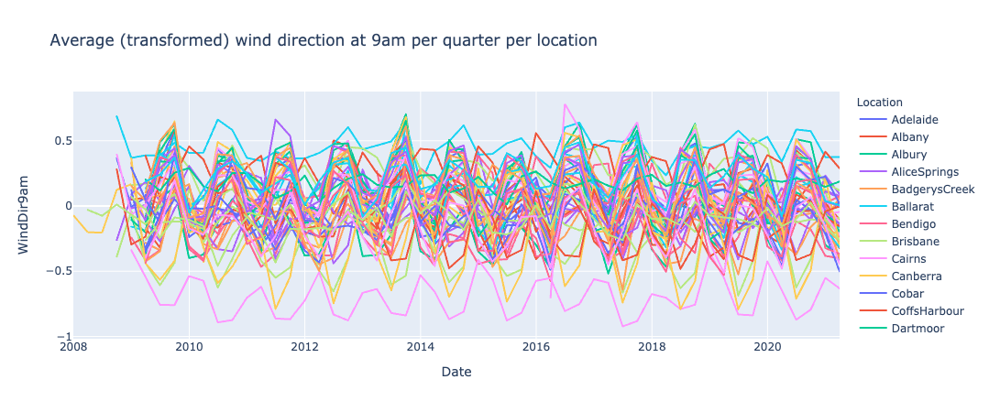

In [15]:
fig = px.line(
    (df
     .set_index("Date")
     .groupby("Location")
     .resample("Q")["WindDir9am"]
     .mean().reset_index()),
    x='Date',
    y='WindDir9am',
    color='Location',
    title="Average (transformed) wind direction at 9am per quarter per location"
)
fig.show()

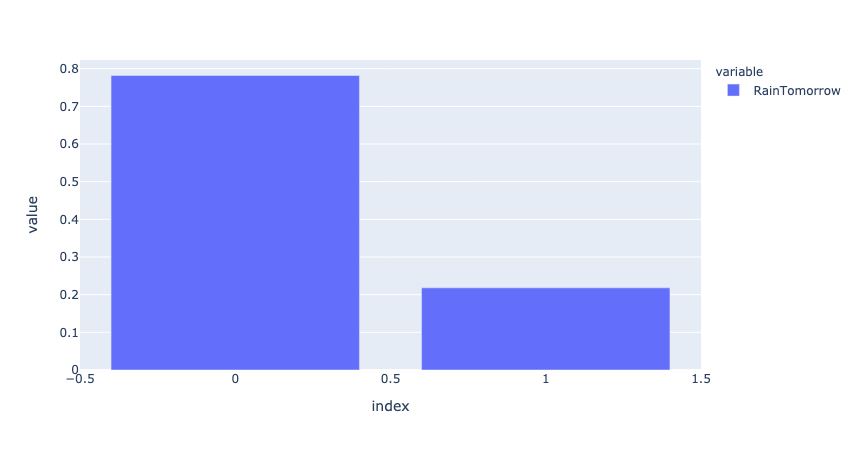

In [16]:
df["RainTomorrow"].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

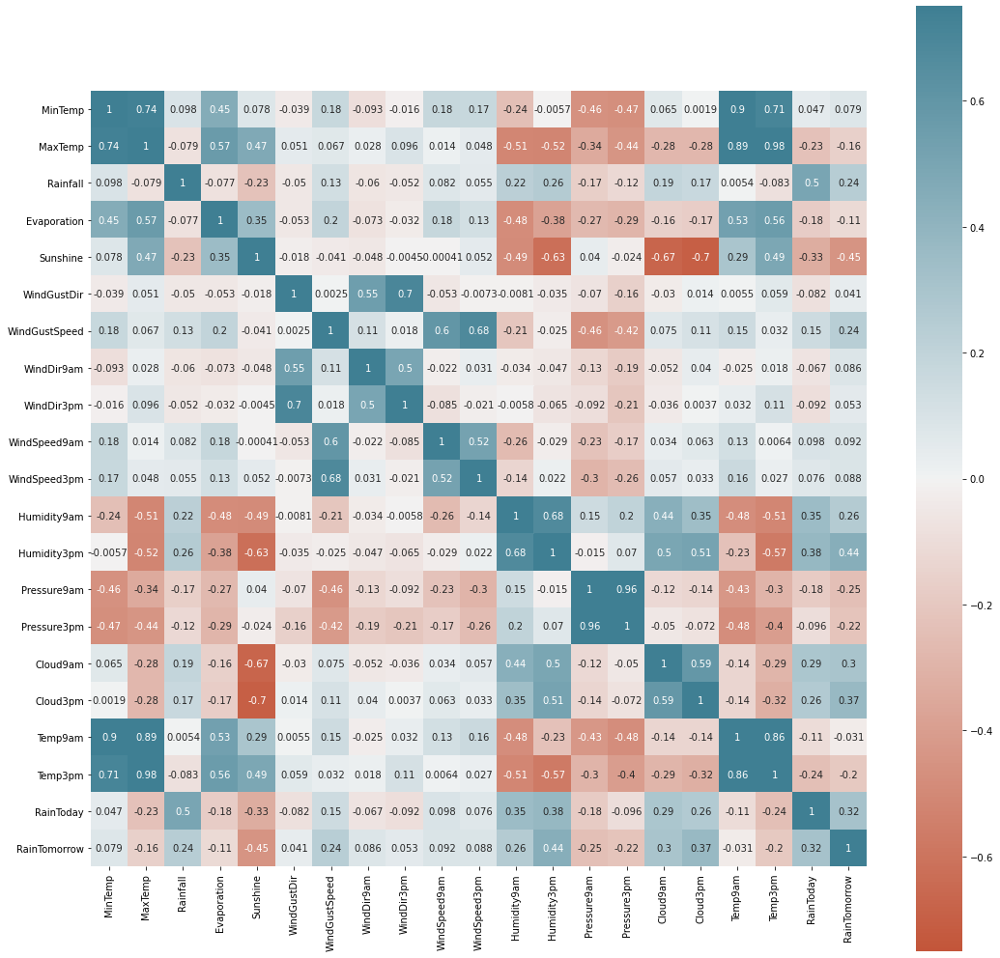

In [17]:
plt.figure(figsize=(18, 18))
sns.heatmap(df.corr(), square=True, annot=True, fmt='.2g',
            cmap=sns.diverging_palette(20, 220, n=256, as_cmap=True),
            vmin=-0.75, vmax=0.75)

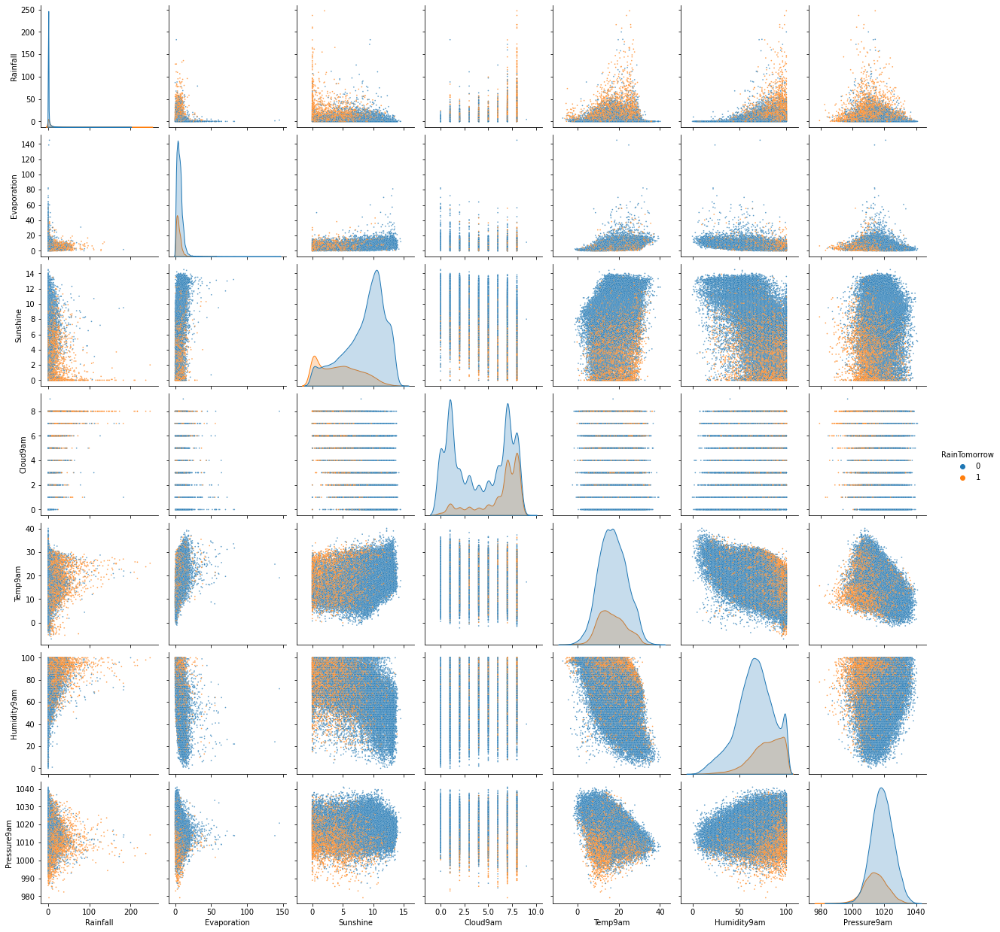

In [19]:
sns.pairplot(df[["Rainfall", "Evaporation", "Sunshine", "Cloud9am", "Temp9am", "Humidity9am", "Pressure9am", "RainTomorrow"]].sample(75000),
             hue="RainTomorrow",
             plot_kws={"alpha": 0.75, "s": 3})

In [20]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop(columns=["RainTomorrow"]), df["RainTomorrow"], test_size=0.25, shuffle=False
)

os.makedirs("./modelling_data", exist_ok=True)
X_train.to_parquet("./modelling_data/X_train.parquet")
X_test.to_parquet("./modelling_data/X_test.parquet")
y_train.to_frame().to_parquet("./modelling_data/y_train.parquet")
y_test.to_frame().to_parquet("./modelling_data/y_test.parquet")